# Lab_2: Using simple classification methods for solving classification problem
# Yuliia Shevchenko
# CS32
# Dataset 3
# Task:
1. Do data preprocessing & data visualization as it was in the 1st lab work
2. Solve classification problem for the selected dataset.
3. Use `examples/fisher_irises.ipynb` as baseline for your experiments
4. Try to optimize hyperparameters of some model

# Datasets for classification
1. [Mushroom Classification](https://www.kaggle.com/datasets/uciml/mushroom-classification)
2. [Fetal Health Classification](https://www.kaggle.com/datasets/andrewmvd/fetal-health-classification)
3. [Glass Classification](https://www.kaggle.com/datasets/uciml/glass)
4. [Gender Classification Dataset](https://www.kaggle.com/datasets/elakiricoder/gender-classification-dataset)
5. [Weather Type Classification](https://www.kaggle.com/datasets/nikhil7280/weather-type-classification)
6. [Star Type Classification / NASA](https://www.kaggle.com/datasets/brsdincer/star-type-classification)
7. [Happiness Classification Dataset](https://www.kaggle.com/datasets/priyanshusethi/happiness-classification-dataset)
8. [NASA: Asteroids Classification
Data Collected from NASA API](https://www.kaggle.com/datasets/shrutimehta/nasa-asteroids-classification)
9. [CS:GO Round Winner Classification](https://www.kaggle.com/datasets/christianlillelund/csgo-round-winner-classification)
10. [Heart Disease Classification Dataset](https://www.kaggle.com/datasets/bharath011/heart-disease-classification-dataset)
11. [Early Classification of Diabetes](https://www.kaggle.com/datasets/andrewmvd/early-diabetes-classification)
12. [Credit Risk Classification Dataset](https://www.kaggle.com/datasets/praveengovi/credit-risk-classification-dataset)

In [3]:
from tqdm import tqdm

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import label_binarize

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc

from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import GridSearchCV


## Data preprocessing & data visualization

In [4]:
df = pd.read_csv("glass.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 214 entries, 0 to 213
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   RI      214 non-null    float64
 1   Na      214 non-null    float64
 2   Mg      214 non-null    float64
 3   Al      214 non-null    float64
 4   Si      214 non-null    float64
 5   K       214 non-null    float64
 6   Ca      214 non-null    float64
 7   Ba      214 non-null    float64
 8   Fe      214 non-null    float64
 9   Type    214 non-null    int64  
dtypes: float64(9), int64(1)
memory usage: 16.8 KB


RI (Індекс заломлення) – показник, що визначає, як скло змінює траєкторію світла.

Na (Натрій) – концентрація натрію у склі, впливає на його хімічні властивості.

Mg (Магній) – використовується для покращення міцності скла.

Al (Алюміній) – додається для термостійкості та механічної міцності.

Si (Кремній) – основний компонент скла.

K (Калій) – впливає на міцність і стійкість скла.

Ca (Кальцій) – підвищує механічну міцність.

Ba (Барій) – використовується для збільшення щільності та світлопропускання.

Fe (Залізо) – може змінювати колір скла та його світлопоглинання.

Type (Тип скла) – категоріальна змінна, що визначає призначення скла.

In [5]:
df.head()

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
0,1.52101,13.64,4.49,1.10,71.78,0.06,8.75,0.0,0.0,1
1,1.51761,13.89,3.60,1.36,72.73,0.48,7.83,0.0,0.0,1
2,1.51618,13.53,3.55,1.54,72.99,0.39,7.78,0.0,0.0,1
3,1.51766,13.21,3.69,1.29,72.61,0.57,8.22,0.0,0.0,1
4,1.51742,13.27,3.62,1.24,73.08,0.55,8.07,0.0,0.0,1


In [6]:
print("Кількість пропущених даних\n", df.isnull().sum())

Кількість пропущених даних
 RI      0
Na      0
Mg      0
Al      0
Si      0
K       0
Ca      0
Ba      0
Fe      0
Type    0
dtype: int64


In [7]:
print("Кількість записів до видалення дублікатів: ", len(df))
df = df.drop_duplicates()
print("Кількість записів після видалення дублікатів:", len(df))

Кількість записів до видалення дублікатів:  214
Кількість записів після видалення дублікатів: 213


In [8]:
df.head()

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
0,1.52101,13.64,4.49,1.10,71.78,0.06,8.75,0.0,0.0,1
1,1.51761,13.89,3.60,1.36,72.73,0.48,7.83,0.0,0.0,1
2,1.51618,13.53,3.55,1.54,72.99,0.39,7.78,0.0,0.0,1
3,1.51766,13.21,3.69,1.29,72.61,0.57,8.22,0.0,0.0,1
4,1.51742,13.27,3.62,1.24,73.08,0.55,8.07,0.0,0.0,1


In [9]:
numeric_cols = df.select_dtypes(include=['float64']).columns
categorical_cols = df.select_dtypes(include=['object']).columns
scaler = StandardScaler()
df[numeric_cols] = scaler.fit_transform(df[numeric_cols])
df.head()

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
0,0.879840,0.289558,1.257238,-0.706370,-1.133248,-0.673480,-0.143466,-0.353808,-0.588301,1
1,-0.243816,0.596403,0.639311,-0.180863,0.097037,-0.028962,-0.790201,-0.353808,-0.588301,1
2,-0.716412,0.154546,0.604596,0.182950,0.433746,-0.167073,-0.825349,-0.353808,-0.588301,1
3,-0.227291,-0.238216,0.701798,-0.322346,-0.058368,0.109149,-0.516041,-0.353808,-0.588301,1
4,-0.306608,-0.164573,0.653197,-0.423405,0.550299,0.078457,-0.621487,-0.353808,-0.588301,1


In [10]:
print("\nMean\n", df.select_dtypes(include='float64').mean())
print("\nMedian\n", df.select_dtypes(include='float64').median())
print("\nStandard Deviation\n", df.select_dtypes(include='float64').std())


Mean
 RI   -1.204670e-14
Na   -3.402599e-15
Mg    2.668705e-16
Al   -1.667941e-16
Si    1.003266e-14
K     7.297241e-17
Ca   -1.200917e-15
Ba   -3.335881e-17
Fe   -1.876433e-17
dtype: float64

Median
 RI   -0.220682
Na   -0.127751
Mg    0.555995
Al   -0.180863
Si    0.174739
K     0.093803
Ca   -0.248912
Ba   -0.353808
Fe   -0.588301
dtype: float64

Standard Deviation
 RI    1.002356
Na    1.002356
Mg    1.002356
Al    1.002356
Si    1.002356
K     1.002356
Ca    1.002356
Ba    1.002356
Fe    1.002356
dtype: float64


In [11]:
df['glass_group'] = df['Type'].map({
    1: 0,
    2: 1,
    3: 2,
    5: 3,
    6: 4,
    7: 5
})

print("\nРозподіл за новими групами:")
print(df['glass_group'].value_counts())




Розподіл за новими групами:
glass_group
1    76
0    69
5    29
2    17
3    13
4     9
Name: count, dtype: int64


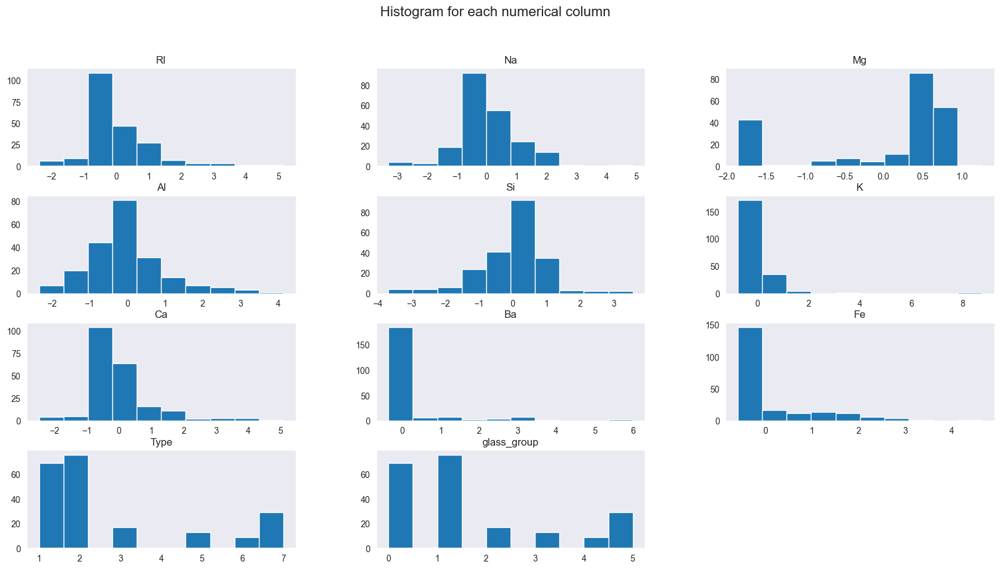

In [12]:
df.select_dtypes(include='number').hist(figsize=(20, 10), grid=False)
plt.suptitle('Histogram for each numerical column', fontsize=16)
plt.show()

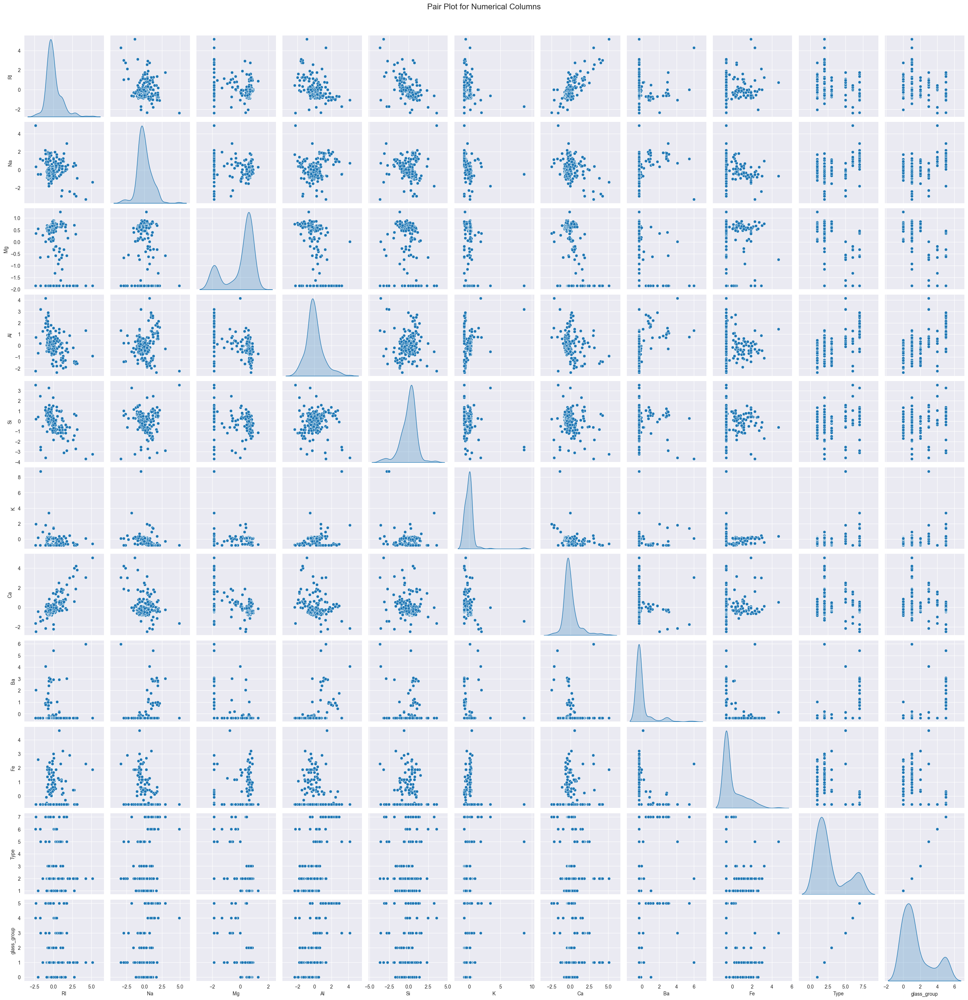

In [13]:
numeric_df = df.select_dtypes(include='number')
sns.pairplot(numeric_df, diag_kind='kde')
plt.suptitle('Pair Plot for Numerical Columns', fontsize=16, y=1.02)
plt.show()

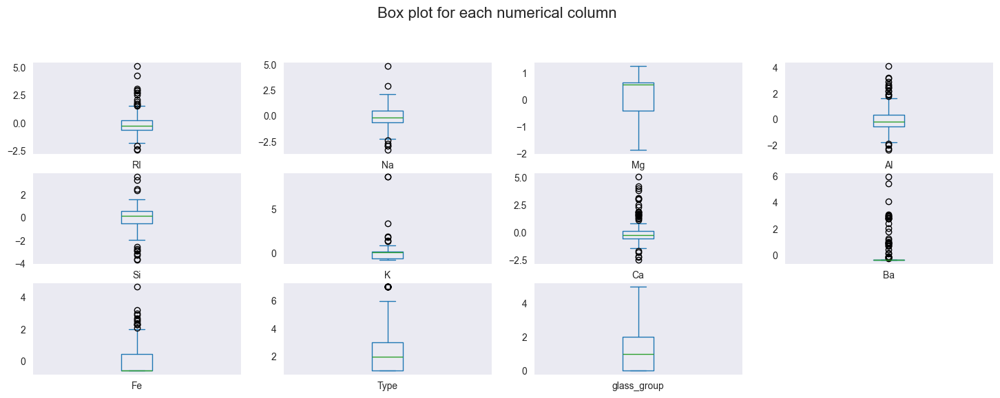

In [14]:
df.select_dtypes(include='number').plot(kind='box', subplots=True, layout=(4, 4), figsize=(18, 8), grid=False)
plt.suptitle('Box plot for each numerical column', fontsize=16)
plt.show()

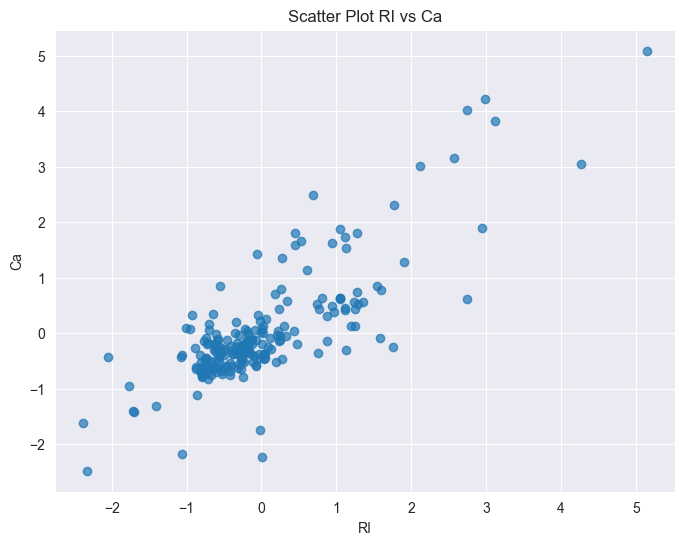

In [15]:
plt.figure(figsize=(8, 6))
plt.scatter(df['RI'], df['Ca'], alpha=0.7)
plt.xlabel('RI')
plt.ylabel('Ca')
plt.title('Scatter Plot RI vs Ca')
plt.grid(True)
plt.show()

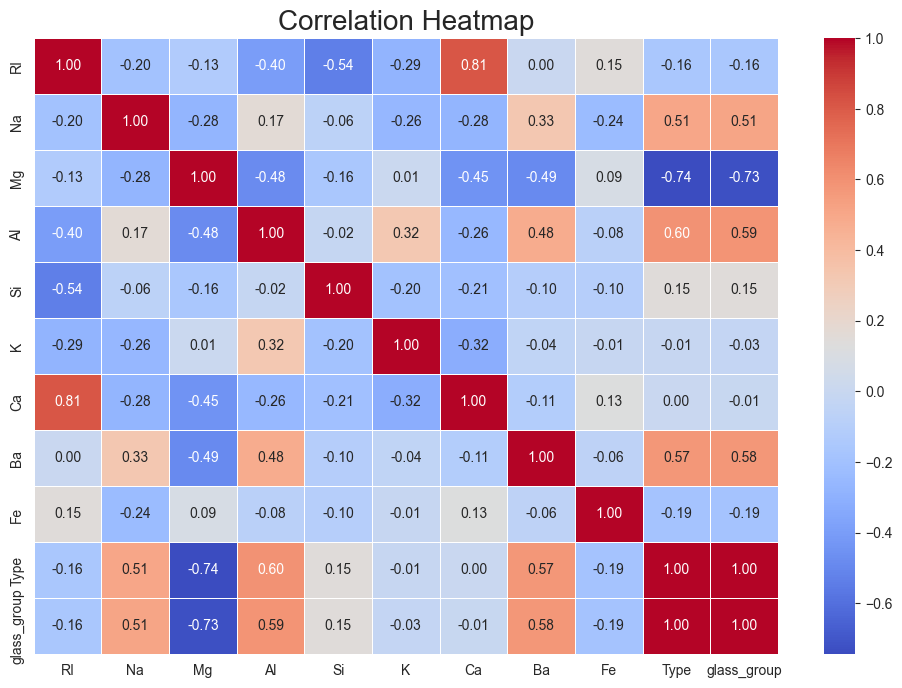

In [16]:
corr_matrix = df.select_dtypes(include='number').corr()

plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap', fontsize=20)
plt.show()

In [17]:
pca_3d = PCA(n_components=3)  # Set the number of components as needed
principal_components_3d = pca_3d.fit_transform(df.drop('glass_group', axis=1))

tsne_3d = TSNE(n_components=3, random_state=42)
embedded_data_3d = tsne_3d.fit_transform(df.drop('glass_group', axis=1))


def visualize_clusters_3d_pca(labels_, clustering_method,
                              label_mapping=None):
    pca_df_3d = pd.DataFrame(data=principal_components_3d, columns=['PC1', 'PC2', 'PC3'])
    pca_df_3d['glass_group'] = labels_
    # pca_df_3d['class'] = pca_df_3d['class'].map(label_mapping)

    fig = px.scatter_3d(
        pca_df_3d, x='PC1', y='PC2', z='PC3',
        color='glass_group', title=f"PCA 3D, {clustering_method}",
        width=600, height=600,
        size=[5] * len(pca_df_3d),
    )

    fig.update_traces(marker=dict(size=2))
    fig.show()


def visualize_clusters_3d_tsne(labels_, clustering_method, label_mapping=None):
    tsne_df_3d = pd.DataFrame(data=embedded_data_3d, columns=["Dim 1", "Dim 2", "Dim 3"])
    tsne_df_3d['glass_group'] = labels_
    # tsne_df_3d['class'] = tsne_df_3d["class"].map(label_mapping)


    fig = px.scatter_3d(
        tsne_df_3d, x='Dim 1', y='Dim 2', z='Dim 3',
        color='glass_group', title=f"t-SNE 3D, {clustering_method}",
        width=600, height=600,
        size=[5] * len(tsne_df_3d),
    )

    fig.update_traces(marker=dict(size=2))
    fig.show()

In [18]:
visualize_clusters_3d_pca(df["glass_group"], "Original Mapping")

In [19]:
visualize_clusters_3d_tsne(df["glass_group"], "Original Mapping")

## Solving classification problem for the selected dataset

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 213 entries, 0 to 213
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   RI           213 non-null    float64
 1   Na           213 non-null    float64
 2   Mg           213 non-null    float64
 3   Al           213 non-null    float64
 4   Si           213 non-null    float64
 5   K            213 non-null    float64
 6   Ca           213 non-null    float64
 7   Ba           213 non-null    float64
 8   Fe           213 non-null    float64
 9   Type         213 non-null    int64  
 10  glass_group  213 non-null    int64  
dtypes: float64(9), int64(2)
memory usage: 28.1 KB


In [21]:
df.head()

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type,glass_group
0,0.879840,0.289558,1.257238,-0.706370,-1.133248,-0.673480,-0.143466,-0.353808,-0.588301,1,0
1,-0.243816,0.596403,0.639311,-0.180863,0.097037,-0.028962,-0.790201,-0.353808,-0.588301,1,0
2,-0.716412,0.154546,0.604596,0.182950,0.433746,-0.167073,-0.825349,-0.353808,-0.588301,1,0
3,-0.227291,-0.238216,0.701798,-0.322346,-0.058368,0.109149,-0.516041,-0.353808,-0.588301,1,0
4,-0.306608,-0.164573,0.653197,-0.423405,0.550299,0.078457,-0.621487,-0.353808,-0.588301,1,0


In [22]:
pca_2d = PCA(n_components=2)
principal_components_2d = pca_3d.fit_transform(df.drop('glass_group', axis=1))

tsne_2d = TSNE(n_components=2, random_state=42)
embedded_data_2d = tsne_3d.fit_transform(df.drop('glass_group', axis=1))

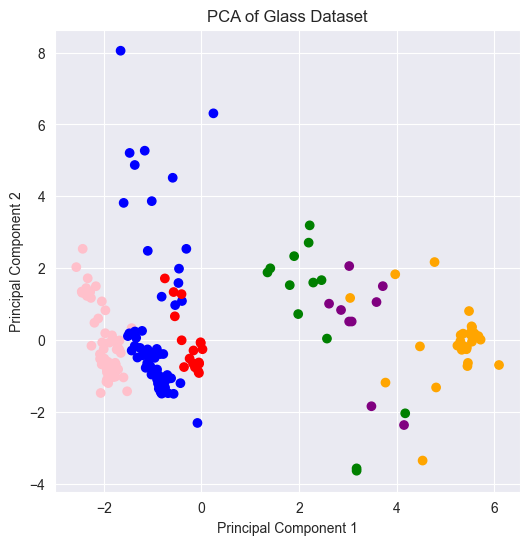

In [23]:
color_map = {
    0: "pink",
    1: "blue",
    2: "red",
    3: "green",
    4: "purple",
    5: "orange"
}

plt.figure(figsize=(6, 6))


# PCA Plot
plt.scatter(principal_components_2d[:, 0], principal_components_2d[:, 1], c=[color_map[cl] for cl in df["glass_group"]])
plt.title('PCA of Glass Dataset')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

plt.show()

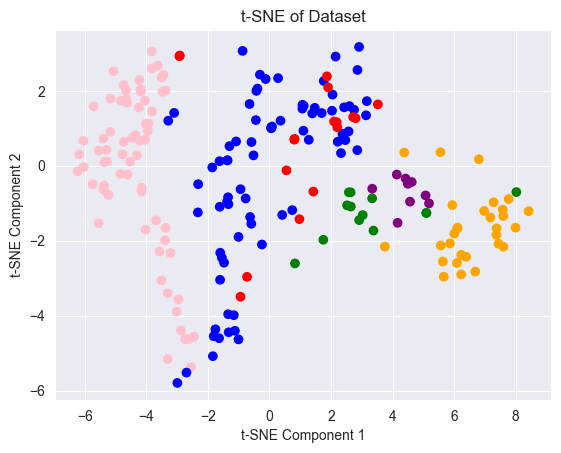

In [24]:
# t-SNE Plot
plt.scatter(embedded_data_2d[:, 0], embedded_data_2d[:, 1], c=[color_map[cl] for cl in df["glass_group"]])
plt.title('t-SNE of Dataset')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')

plt.show()

In [25]:
X_train, X_test, y_train, y_test = train_test_split(
    df.drop("glass_group", axis=1),
    df["glass_group"],
    test_size=0.2,
    random_state=8418,
)


# 5. Tran & Test various classification models

## 5.1. Naive Bayes

In [26]:
gnb = GaussianNB()
gnb.fit(X_train, y_train)

GaussianNB()

In [27]:
y_pred_train = gnb.predict(X_train)
y_pred_test = gnb.predict(X_test)
target_names = ['0','1', '2', '3','4', '5']


train_acc = accuracy_score(y_train, y_pred_train)
test_acc = accuracy_score(y_test, y_pred_test)
report = classification_report(y_test, y_pred_test, target_names=target_names)

print(f"Train acc {train_acc}; Test acc {test_acc}")
print(report)

Train acc 1.0; Test acc 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        14
           1       1.00      1.00      1.00        15
           2       1.00      1.00      1.00         3
           3       1.00      1.00      1.00         2
           4       1.00      1.00      1.00         3
           5       1.00      1.00      1.00         6

    accuracy                           1.00        43
   macro avg       1.00      1.00      1.00        43
weighted avg       1.00      1.00      1.00        43



In [28]:
def plot_confusion_matrix(y_true, y_pred, target_names, title='Confusion Matrix', cmap='Blues'):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, xticklabels=target_names, yticklabels=target_names)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title(title)
    plt.show()


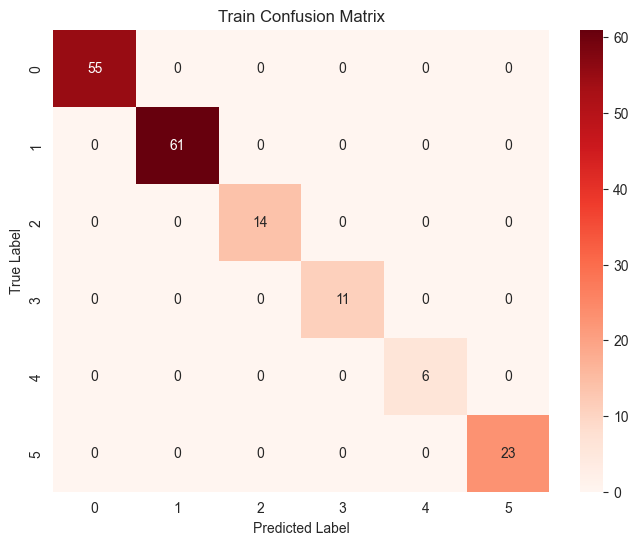

In [29]:
plot_confusion_matrix(y_train, y_pred_train, target_names=target_names, title='Train Confusion Matrix', cmap='Reds')


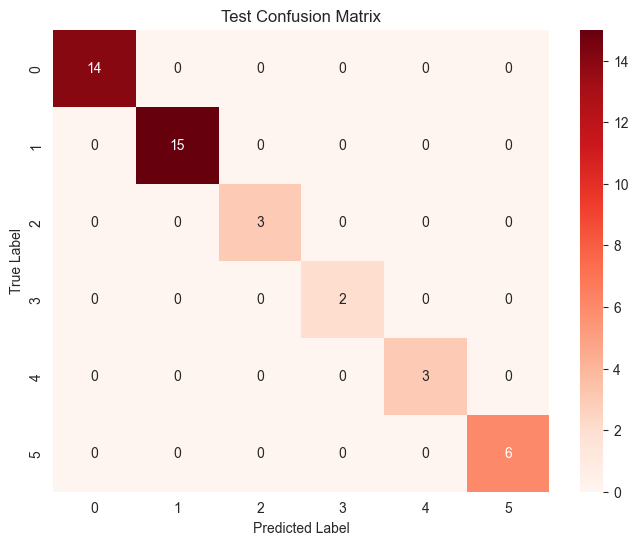

In [30]:
plot_confusion_matrix(y_test, y_pred_test, target_names=target_names, title='Test Confusion Matrix', cmap='Reds')


In [31]:
def plot_roc_curves(classifier, X, y, colors=None, figsize=(18, 10), title_prefix='ROC Curve'):
    unique_classes = np.unique(y)
    y_onehot = label_binarize(y, classes=unique_classes)
    y_score = classifier.predict_proba(X)

    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(len(unique_classes)):
        fpr[i], tpr[i], _ = roc_curve(y_onehot[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    n_classes = len(unique_classes)
    ncols = 3
    nrows = (n_classes + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
    axes = axes.flatten()

    if colors is None:
        colors = ['green', 'blue', 'red', 'purple', 'orange', 'pink']

    for i, ax in enumerate(axes):
        if i < n_classes:
            color = colors[i % len(colors)]
            ax.plot(fpr[i], tpr[i], color=color, lw=2,
                    label=f'ROC (AUC = {roc_auc[i]:.2f})')
            ax.plot([0, 1], [0, 1], 'k--', lw=1)
            ax.set_xlim([0.0, 1.0])
            ax.set_ylim([0.0, 1.05])
            ax.set_xlabel('False Positive Rate')
            ax.set_ylabel('True Positive Rate')
            ax.set_title(f'{title_prefix} - Class {unique_classes[i]}')
            ax.legend(loc="lower right")
        else:
            ax.axis('off')

    plt.tight_layout()
    plt.show()


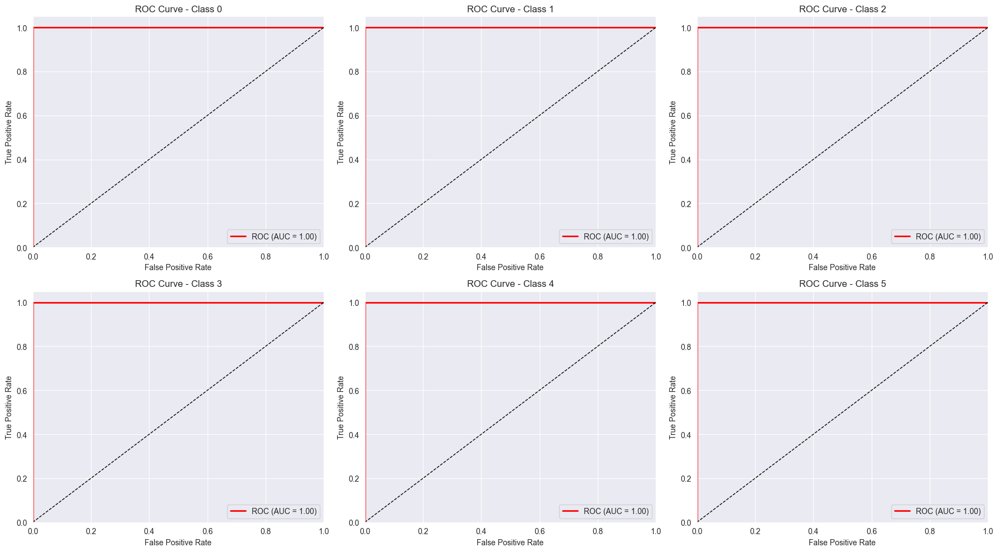

In [32]:
plot_roc_curves(gnb, X_train, y_train, colors=['red'])

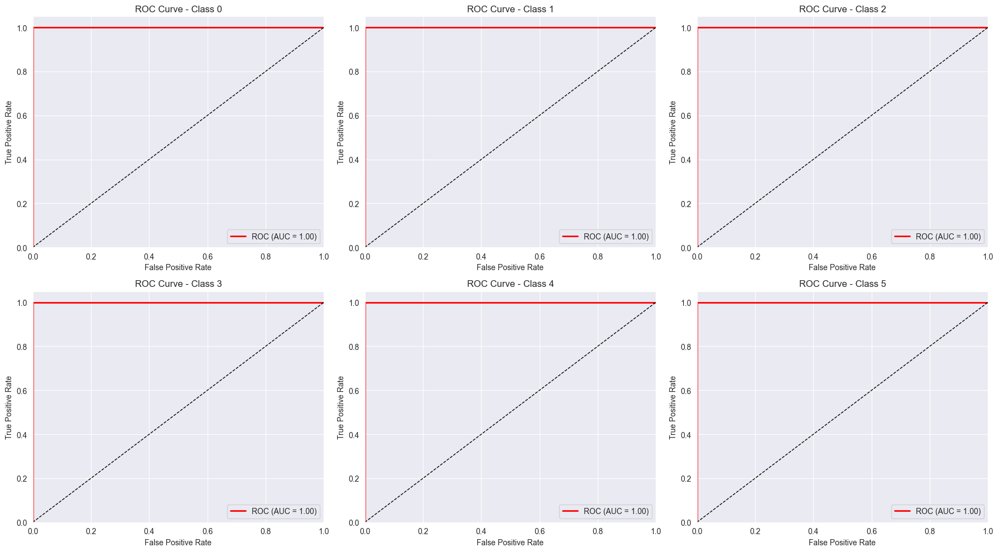

In [33]:
plot_roc_curves(gnb, X_test, y_test, colors=['red'])

## 5.2. Linear Regression Classifier

In [34]:
log_reg = LogisticRegression(max_iter=180)
log_reg.fit(X_train, y_train)

LogisticRegression(max_iter=180)

In [35]:
y_pred_train = log_reg.predict(X_train)
y_pred_test = log_reg.predict(X_test)

In [36]:
train_acc = accuracy_score(y_train, y_pred_train)
test_acc = accuracy_score(y_test, y_pred_test)
target_names_str = [str(x) for x in np.unique(y_train)]
report = classification_report(y_test, y_pred_test, target_names=target_names_str)

In [37]:
print(f"Train acc {train_acc}; Test acc {test_acc}")
print(report)

Train acc 0.9823529411764705; Test acc 0.9534883720930233
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        14
           1       1.00      0.93      0.97        15
           2       1.00      1.00      1.00         3
           3       0.50      1.00      0.67         2
           4       1.00      1.00      1.00         3
           5       1.00      0.83      0.91         6

    accuracy                           0.95        43
   macro avg       0.92      0.96      0.92        43
weighted avg       0.98      0.95      0.96        43



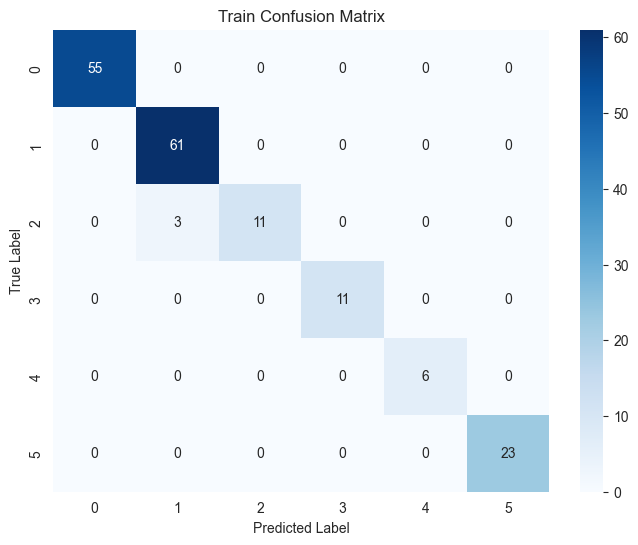

In [38]:
plot_confusion_matrix(y_train, y_pred_train, target_names=target_names, title='Train Confusion Matrix', cmap='Blues')

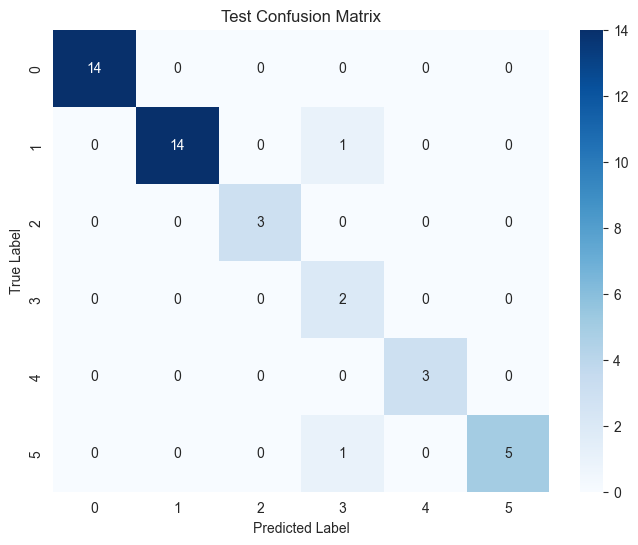

In [39]:
plot_confusion_matrix(y_test, y_pred_test, target_names=target_names, title='Test Confusion Matrix', cmap='Blues')

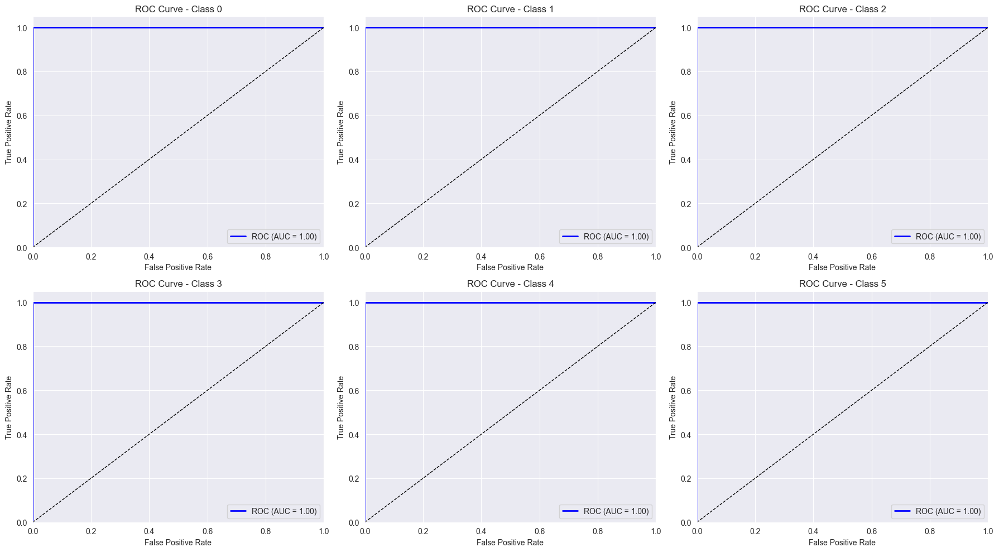

In [40]:
plot_roc_curves(log_reg, X_train, y_train, colors=['blue'])

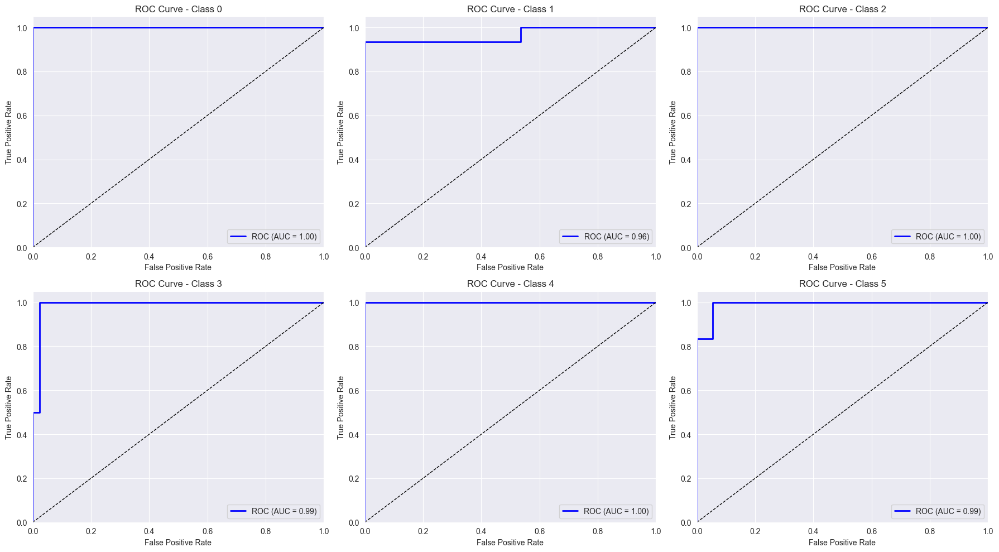

In [41]:
plot_roc_curves(log_reg, X_test, y_test, colors=['blue'])

## 5.3. SVC

In [42]:
from sklearn.preprocessing import label_binarize

kernels = ['linear', 'poly', 'rbf', 'sigmoid']
results = {}

unique_classes = np.unique(y_train)
n_classes = len(unique_classes)
y_test_bin = label_binarize(y_test, classes=unique_classes)
y_train_bin = label_binarize(y_train, classes=unique_classes)

roc_data_test = {kernel: {} for kernel in kernels}
roc_data_train = {kernel: {} for kernel in kernels}

roc_data = {kernel: {} for kernel in kernels}

for kernel in kernels:
    print(f"\n--- Kernel: {kernel} ---")
    svc = SVC(kernel=kernel, probability=True, class_weight='balanced', random_state=42)
    svc.fit(X_train, y_train)

    y_pred_train = svc.predict(X_train)
    y_pred_test = svc.predict(X_test)

    train_acc = accuracy_score(y_train, y_pred_train)
    test_acc = accuracy_score(y_test, y_pred_test)
    report = classification_report(y_test, y_pred_test, zero_division=0)

    results[kernel] = {
        "train_acc": train_acc,
        "test_acc": test_acc,
        "report": report
    }

    print(f"Train acc: {train_acc:.4f}; Test acc: {test_acc:.4f}")
    print(report)

    # ROC для тесту
    y_score_test = svc.predict_proba(X_test)
    for i in range(n_classes):
        fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score_test[:, i])
        roc_auc = auc(fpr, tpr)
        roc_data_test[kernel][i] = {'fpr': fpr, 'tpr': tpr, 'auc': roc_auc}

    # ROC для тренування
    y_score_train = svc.predict_proba(X_train)
    for i in range(n_classes):
        fpr, tpr, _ = roc_curve(y_train_bin[:, i], y_score_train[:, i])
        roc_auc = auc(fpr, tpr)
        roc_data_train[kernel][i] = {'fpr': fpr, 'tpr': tpr, 'auc': roc_auc}



--- Kernel: linear ---
Train acc: 1.0000; Test acc: 0.9767
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        14
           1       1.00      1.00      1.00        15
           2       1.00      1.00      1.00         3
           3       0.67      1.00      0.80         2
           4       1.00      1.00      1.00         3
           5       1.00      0.83      0.91         6

    accuracy                           0.98        43
   macro avg       0.94      0.97      0.95        43
weighted avg       0.98      0.98      0.98        43


--- Kernel: poly ---
Train acc: 0.6706; Test acc: 0.6977
              precision    recall  f1-score   support

           0       0.52      1.00      0.68        14
           1       1.00      0.13      0.24        15
           2       1.00      1.00      1.00         3
           3       1.00      1.00      1.00         2
           4       1.00      1.00      1.00         3
           5  

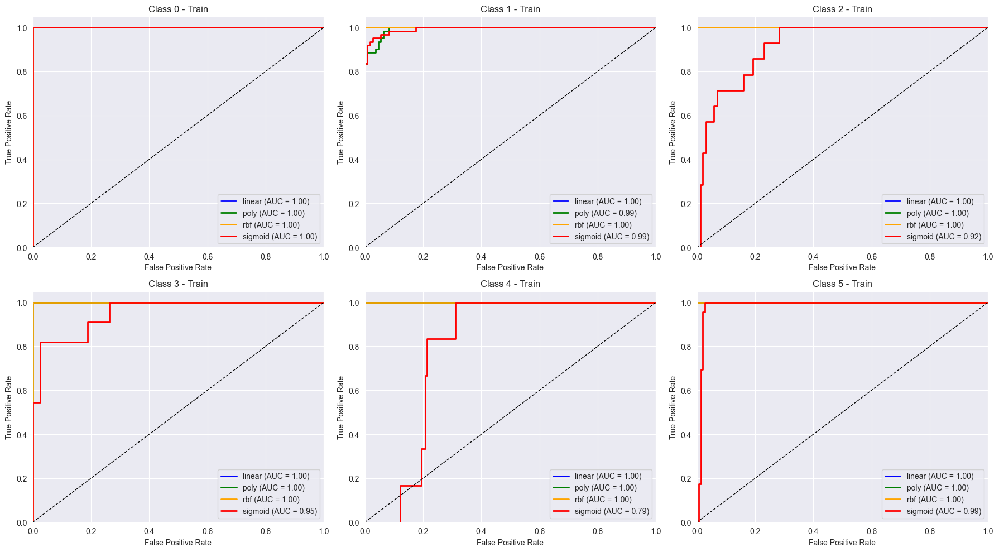

In [43]:
colors = {
    'linear': 'blue',
    'poly': 'green',
    'rbf': 'orange',
    'sigmoid': 'red'
}
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    for kernel in kernels:
        data = roc_data_train[kernel][i]
        ax.plot(data['fpr'], data['tpr'], lw=2, color=colors[kernel],
                label=f"{kernel} (AUC = {data['auc']:.2f})")
    ax.plot([0, 1], [0, 1], 'k--', lw=1)
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title(f"Class {unique_classes[i]} - Train")
    ax.legend(loc="lower right")

for j in range(n_classes, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

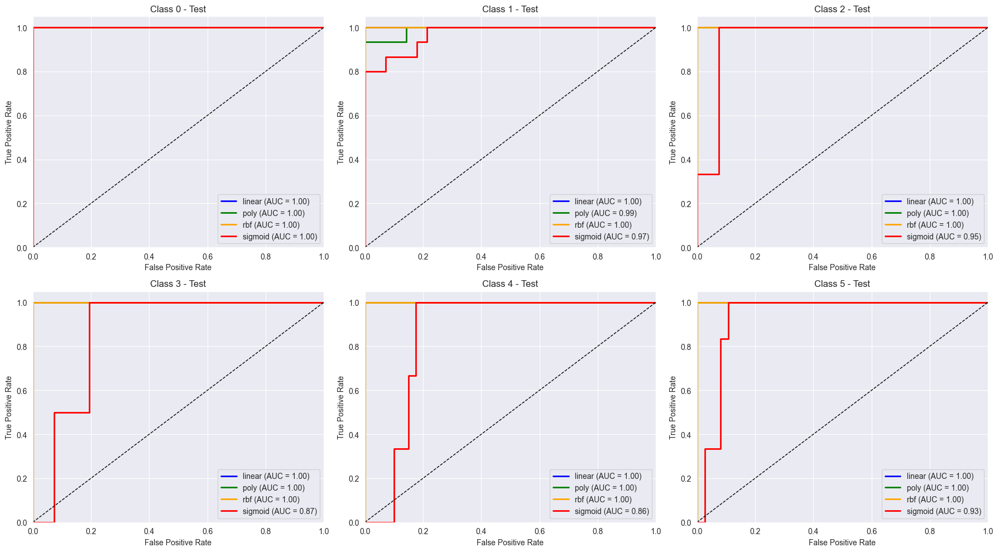

In [44]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for i in range(n_classes):
    ax = axes[i]
    for kernel in kernels:
        data = roc_data_test[kernel][i]
        ax.plot(data['fpr'], data['tpr'], lw=2, color=colors[kernel],
                label=f"{kernel} (AUC = {data['auc']:.2f})")
    ax.plot([0, 1], [0, 1], 'k--', lw=1)
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title(f"Class {unique_classes[i]} - Test")
    ax.legend(loc="lower right")

for j in range(n_classes, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

## 5.4. Decision Tree

In [45]:
dt_classifier = DecisionTreeClassifier(max_depth=4)
dt_classifier.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=4)

In [46]:
y_pred_train = dt_classifier.predict(X_train)
y_pred_test = dt_classifier.predict(X_test)

train_acc = accuracy_score(y_train, y_pred_train)
test_acc = accuracy_score(y_test, y_pred_test)
report = classification_report(y_test, y_pred_test, target_names=target_names, zero_division=0)

print(f"Train acc {train_acc}; Test acc {test_acc}")
print(report)

Train acc 0.9647058823529412; Test acc 0.9302325581395349
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        14
           1       1.00      1.00      1.00        15
           2       1.00      1.00      1.00         3
           3       0.40      1.00      0.57         2
           4       0.00      0.00      0.00         3
           5       1.00      1.00      1.00         6

    accuracy                           0.93        43
   macro avg       0.73      0.83      0.76        43
weighted avg       0.90      0.93      0.91        43



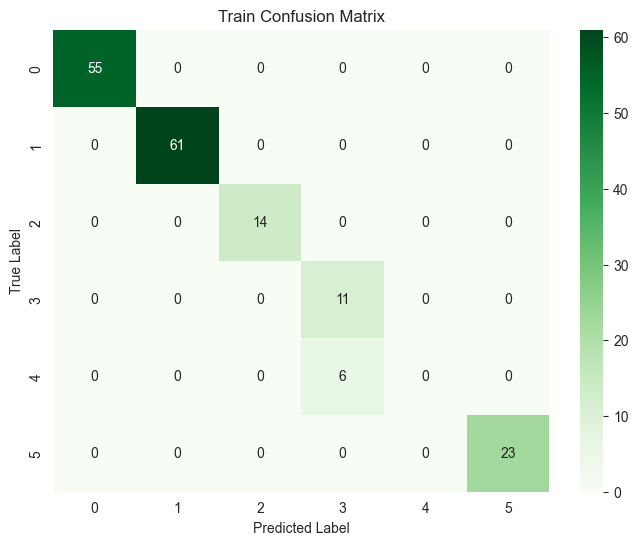

In [47]:
plot_confusion_matrix(y_train, y_pred_train, target_names=target_names, title='Train Confusion Matrix', cmap='Greens')

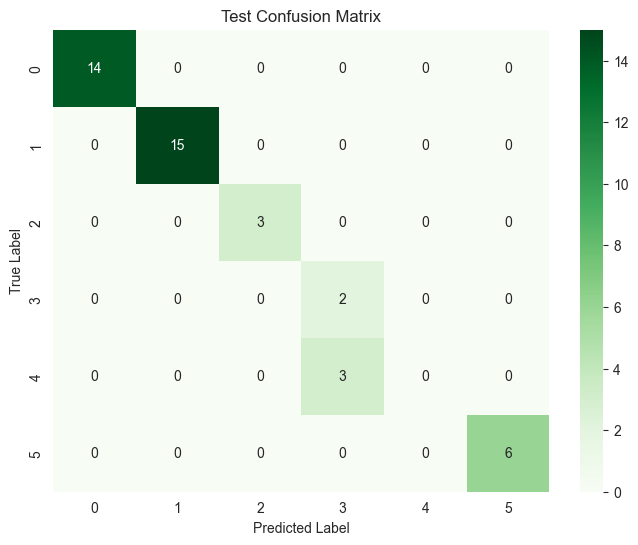

In [48]:
plot_confusion_matrix(y_test, y_pred_test, target_names=target_names, title='Test Confusion Matrix', cmap='Greens')

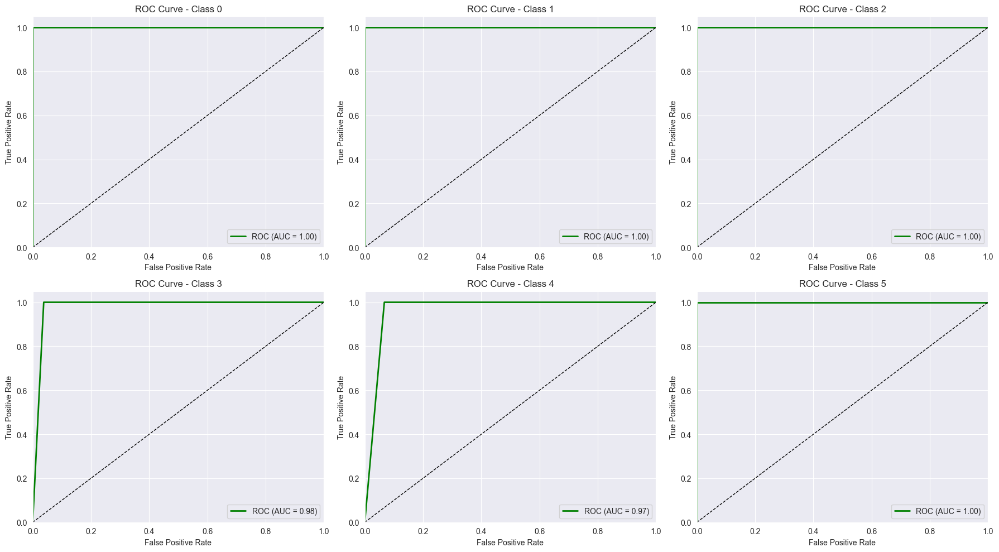

In [49]:
plot_roc_curves(dt_classifier, X_train, y_train, colors=['green'])

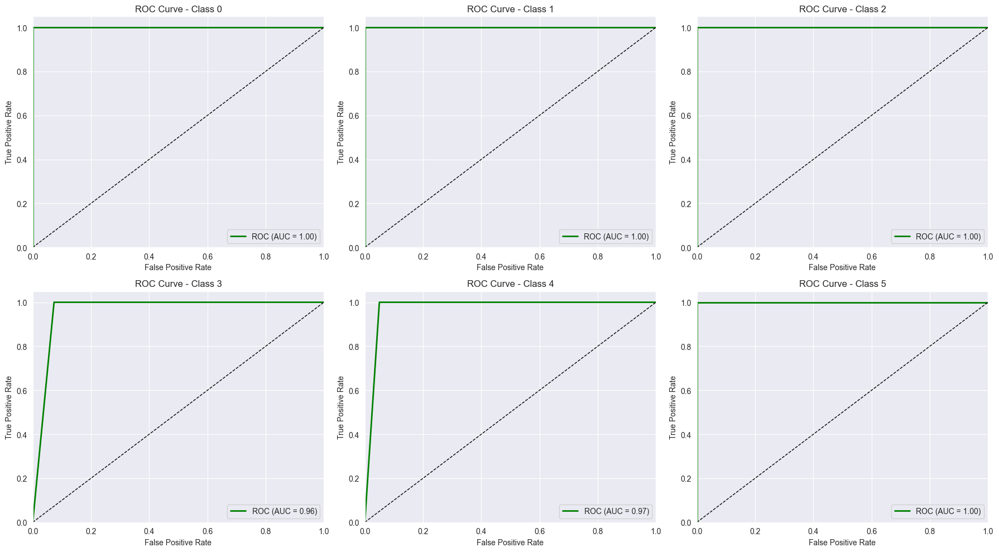

In [50]:
plot_roc_curves(dt_classifier, X_test, y_test, colors=['green'])

## 5.5. Random Forest Classifier

In [51]:
rf_cl = RandomForestClassifier(random_state=42, max_depth=4)

rf_cl.fit(X_train, y_train)

RandomForestClassifier(max_depth=4, random_state=42)

In [52]:
y_pred_train = rf_cl.predict(X_train)
y_pred_test = rf_cl.predict(X_test)

train_acc = accuracy_score(y_train, y_pred_train)
test_acc = accuracy_score(y_test, y_pred_test)
report = classification_report(y_test, y_pred_test, target_names=target_names, zero_division=0)

print(f"Train acc {train_acc}; Test acc {test_acc}")
print(report)

Train acc 0.9941176470588236; Test acc 0.9767441860465116
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        14
           1       1.00      1.00      1.00        15
           2       1.00      1.00      1.00         3
           3       0.67      1.00      0.80         2
           4       1.00      1.00      1.00         3
           5       1.00      0.83      0.91         6

    accuracy                           0.98        43
   macro avg       0.94      0.97      0.95        43
weighted avg       0.98      0.98      0.98        43



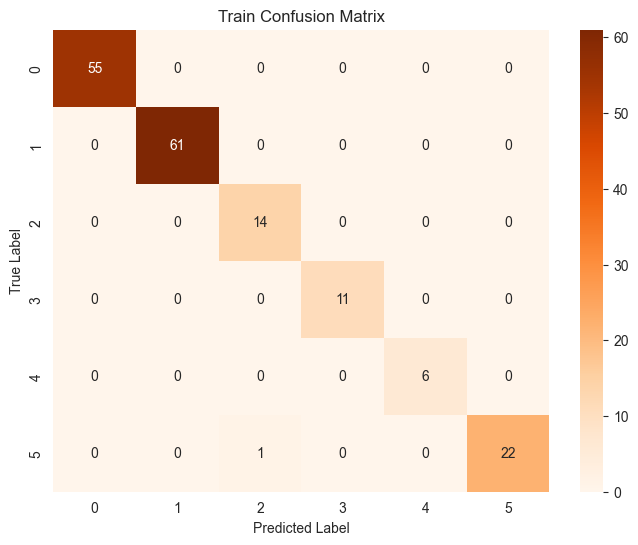

In [53]:
plot_confusion_matrix(y_train, y_pred_train, target_names=target_names, title='Train Confusion Matrix', cmap='Oranges')

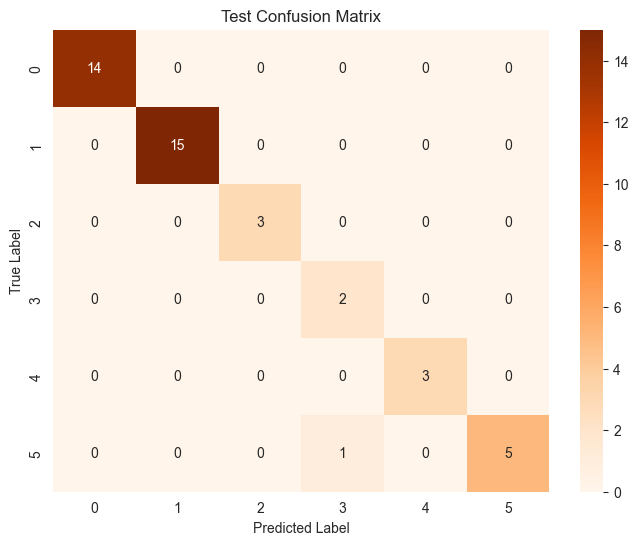

In [54]:
plot_confusion_matrix(y_test, y_pred_test, target_names=target_names, title='Test Confusion Matrix', cmap='Oranges')

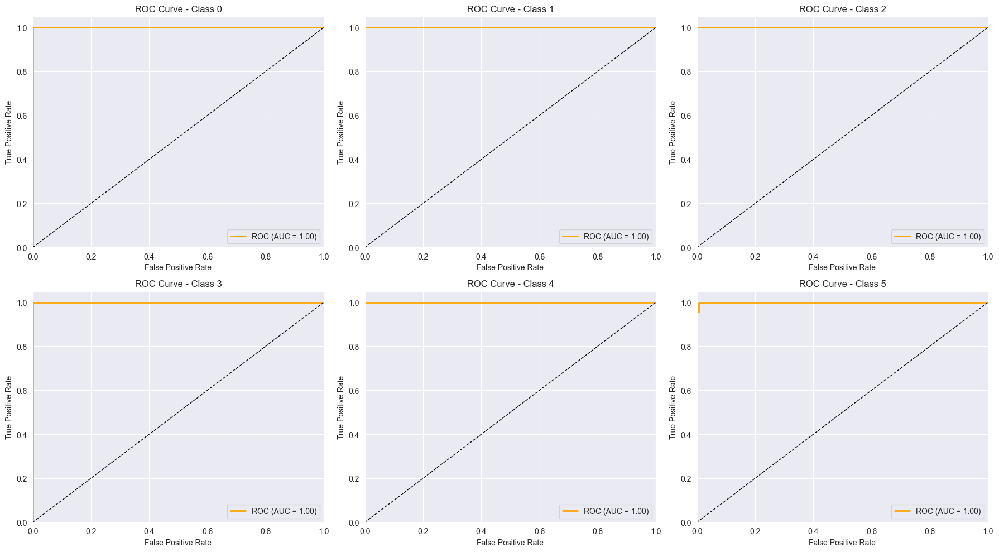

In [55]:
plot_roc_curves(rf_cl, X_train, y_train, colors=['orange'])

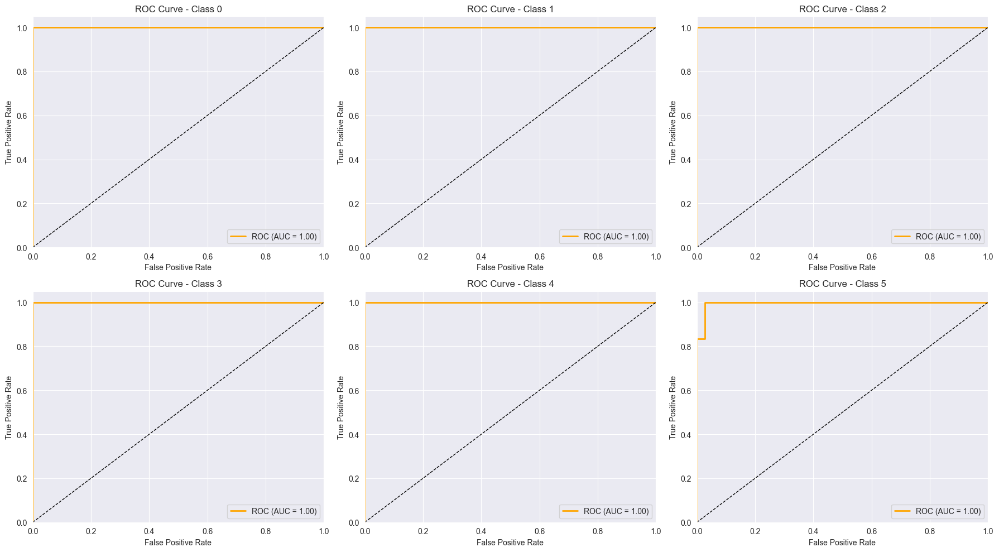

In [56]:
plot_roc_curves(rf_cl, X_test, y_test, colors=['orange'])

## 5.6. Gradient Boosting Classifier

In [57]:
gb_classifier = GradientBoostingClassifier(random_state=42)

# Train the classifier
gb_classifier.fit(X_train, y_train)

GradientBoostingClassifier(random_state=42)

In [58]:
y_pred_train = gb_classifier.predict(X_train)
y_pred_test = gb_classifier.predict(X_test)

train_acc = accuracy_score(y_train, y_pred_train)
test_acc = accuracy_score(y_test, y_pred_test)
report = classification_report(y_test, y_pred_test, target_names=target_names)

print(f"Train acc {train_acc}; Test acc {test_acc}")
print(report)

Train acc 1.0; Test acc 0.9767441860465116
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        14
           1       1.00      1.00      1.00        15
           2       1.00      1.00      1.00         3
           3       1.00      1.00      1.00         2
           4       0.75      1.00      0.86         3
           5       1.00      0.83      0.91         6

    accuracy                           0.98        43
   macro avg       0.96      0.97      0.96        43
weighted avg       0.98      0.98      0.98        43



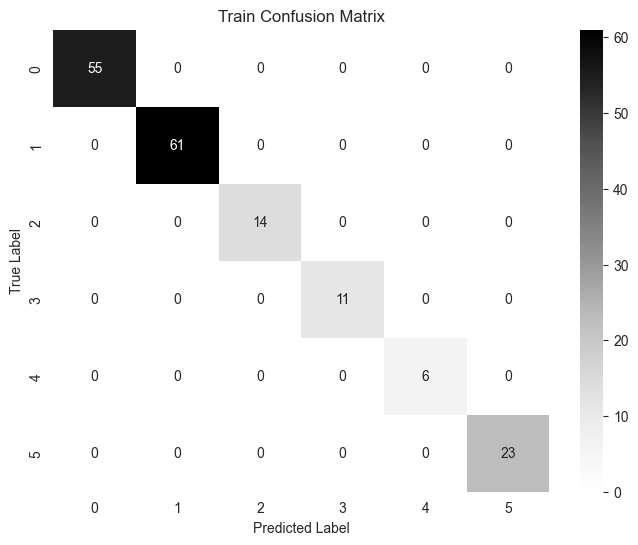

In [59]:
plot_confusion_matrix(y_train, y_pred_train, target_names=target_names, title='Train Confusion Matrix', cmap='Greys')

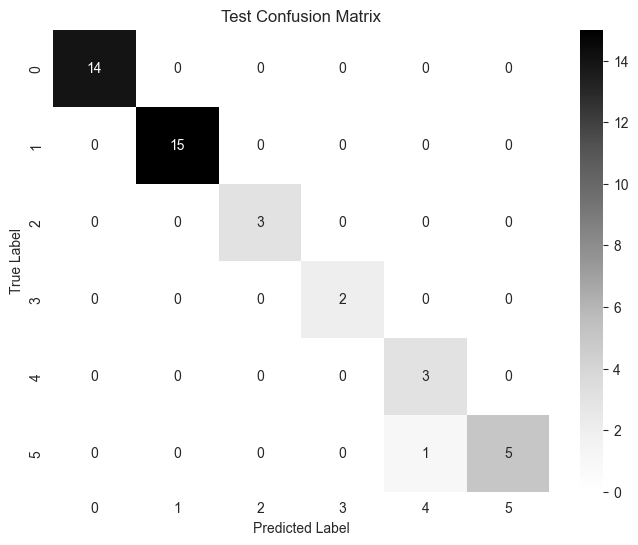

In [60]:
plot_confusion_matrix(y_test, y_pred_test, target_names=target_names, title='Test Confusion Matrix', cmap='Greys')

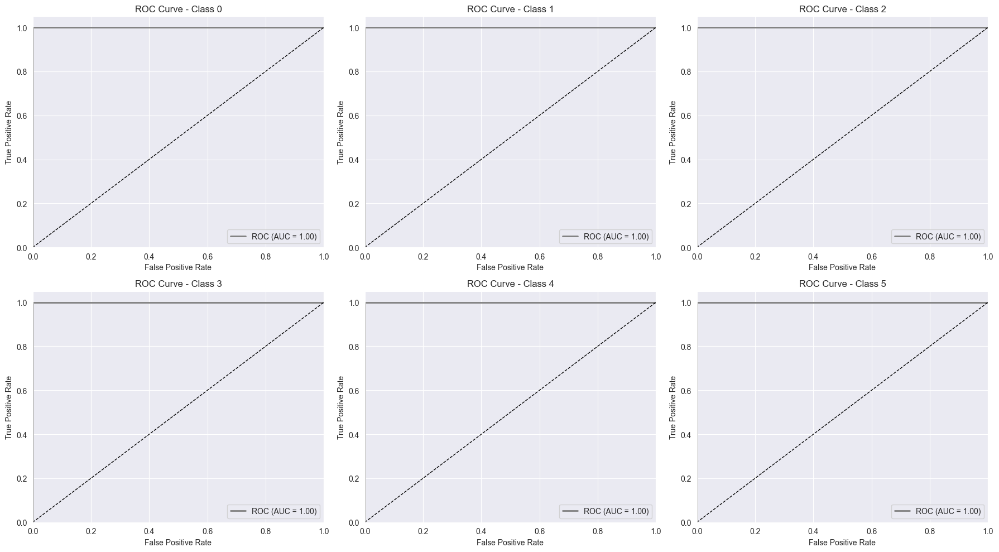

In [61]:
plot_roc_curves(gb_classifier, X_train, y_train, colors=['grey'])

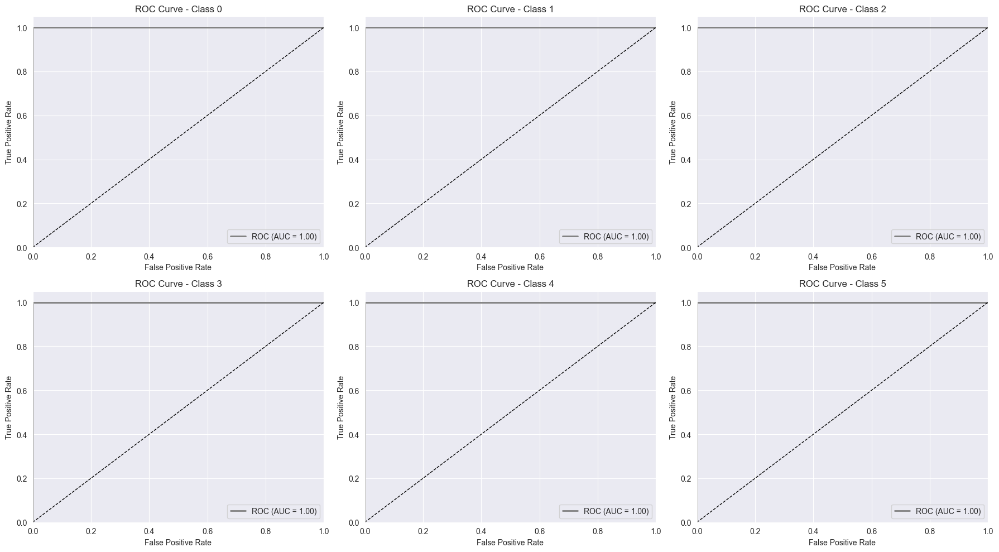

In [62]:
plot_roc_curves(gb_classifier, X_test, y_test, colors=['grey'])

## 5.7. AdaBoost Classifier

In [63]:
ada_classifier = AdaBoostClassifier(random_state=42)

# Train the classifier
ada_classifier.fit(X_train, y_train)

AdaBoostClassifier(random_state=42)

In [64]:
y_pred_train = ada_classifier.predict(X_train)
y_pred_test = ada_classifier.predict(X_test)

train_acc = accuracy_score(y_train, y_pred_train)
test_acc = accuracy_score(y_test, y_pred_test)
report = classification_report(y_test, y_pred_test, target_names=target_names, zero_division=0)

print(f"Train acc {train_acc}; Test acc {test_acc}")
print(report)

Train acc 0.9647058823529412; Test acc 0.9302325581395349
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        14
           1       1.00      1.00      1.00        15
           2       1.00      1.00      1.00         3
           3       0.40      1.00      0.57         2
           4       0.00      0.00      0.00         3
           5       1.00      1.00      1.00         6

    accuracy                           0.93        43
   macro avg       0.73      0.83      0.76        43
weighted avg       0.90      0.93      0.91        43



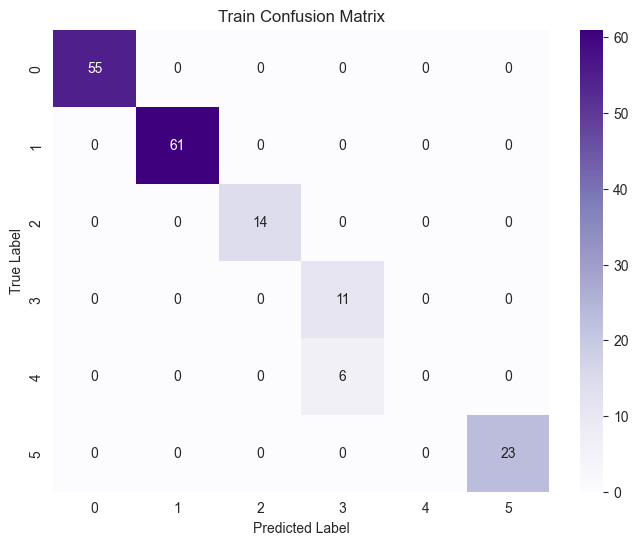

In [65]:
plot_confusion_matrix(y_train, y_pred_train, target_names=target_names, title='Train Confusion Matrix', cmap='Purples')

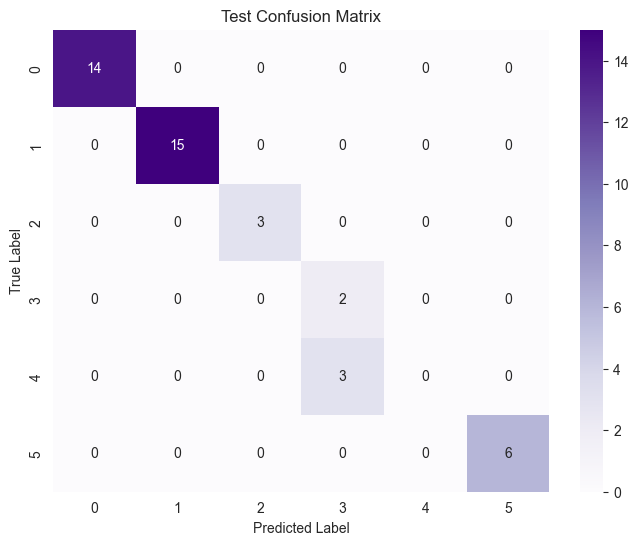

In [66]:
plot_confusion_matrix(y_test, y_pred_test, target_names=target_names, title='Test Confusion Matrix', cmap='Purples')

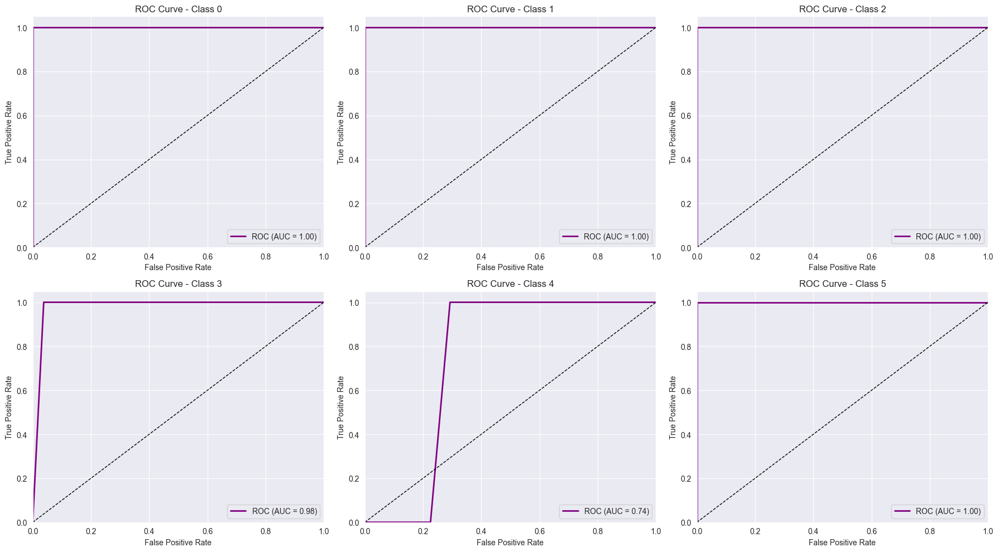

In [67]:
plot_roc_curves(ada_classifier, X_train, y_train, colors=['purple'])

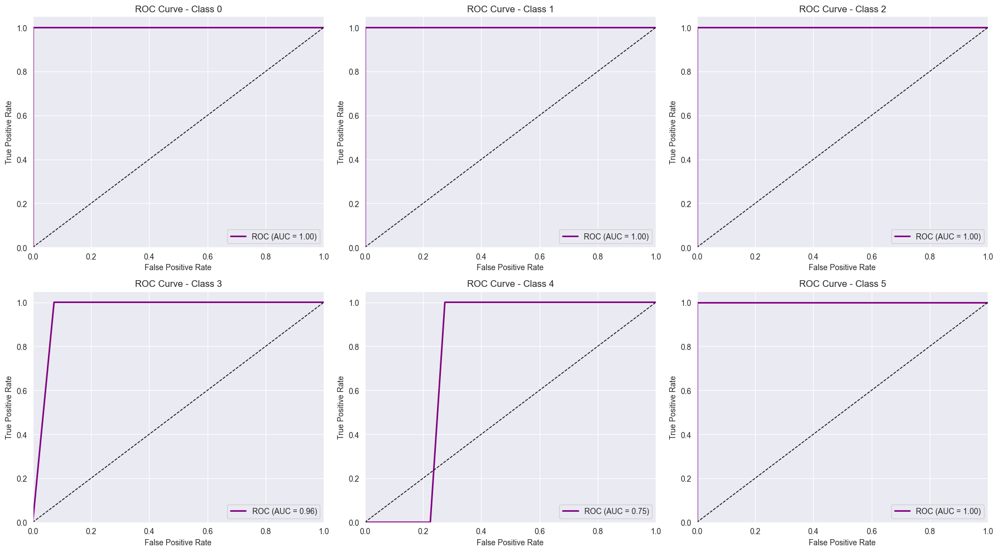

In [68]:
plot_roc_curves(ada_classifier, X_test, y_test, colors=['purple'])

In [69]:
n_estimators_list = range(1, 100, 3)
accuracies_list = []
for n_estimators in tqdm(n_estimators_list):
    ada_cl = AdaBoostClassifier(random_state=42, n_estimators=n_estimators)
    ada_cl.fit(X_train, y_train)

    y_pred_train = ada_cl.predict(X_train)
    train_acc = accuracy_score(y_train, y_pred_train)
    accuracies_list.append(train_acc)

100%|██████████| 33/33 [00:03<00:00,  9.44it/s]


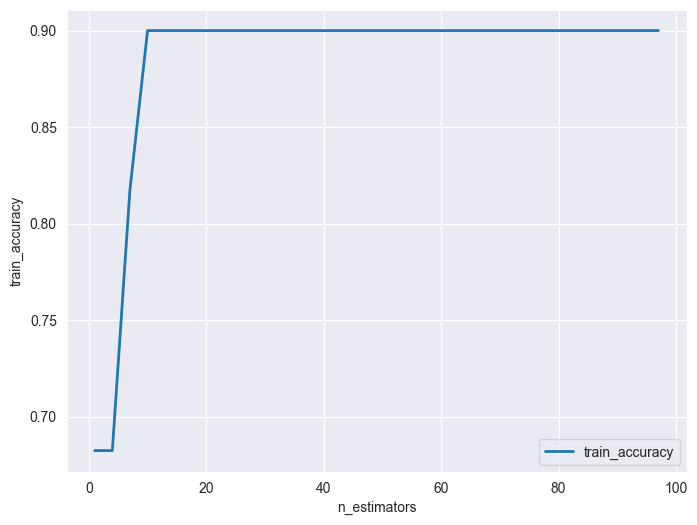

In [70]:
plt.figure(figsize=(8, 6))
plt.plot(n_estimators_list, accuracies_list, lw=2,
             label='train_accuracy')
plt.xlabel('n_estimators')
plt.ylabel('train_accuracy')
plt.legend(loc="lower right")
plt.show()

| Модель                  | Train acc | Test acc | Коментар по якості                                 |
| ----------------------- | --------- | -------- | -------------------------------------------------- |
| **GaussianNB**          | 1.00      | 1.00     | Ідеальні показники, 100% точність на тесті         |
| **Logistic Regression** | 0.98      | 0.95     | Висока точність, трохи гірше за GaussianNB         |
| **SVC (linear kernel)** | 1.00      | 0.98     | Дуже високі результати, майже ідеальні             |
| SVC (poly kernel)       | 0.67      | 0.70     | Низька точність, модель недонавчена                |
| SVC (rbf kernel)        | 1.00      | 0.95     | Хороші результати, близькі до логістичної регресії |
| SVC (sigmoid kernel)    | 0.63      | 0.56     | Дуже низька точність, погана модель                |
| Decision Tree           | 0.96      | 0.93     | Хороша точність, але гірше за RF і GB              |
| Random Forest           | 0.99      | 0.98     | Висока точність, стабільна модель                  |
| Gradient Boosting       | 1.00      | 0.98     | Висока точність, дещо кращий за RF у recall/f1     |
| AdaBoost Classifier     | 0.96      | 0.93     | Аналогічно до Decision Tree, трохи гірше           |


## Висновок
Найкраща модель — GaussianNB, бо має ідеальну точність на тренуванні та тестуванні. Всі класи класифіковані ідеально.

На другому місці — Gradient Boosting та Random Forest, вони також дуже точні (понад 97%) і мають стабільні метрики precision/recall/f1, особливо добре працюють з менш поширеними класами.

SVC з лінійним ядром також дає дуже хороший результат, трохи нижчий за RF/GB.

Logistic Regression і SVC з RBF ядром — сильні, але дещо поступаються кращим.

Decision Tree та AdaBoost трохи гірші, особливо з класом 4, де є нульові показники.

SVC з полі та сигмоїдним ядром — найгірші, не рекомендуються.

## 4.  Optimize hyperparameters of model

In [71]:
rf_cl = RandomForestClassifier()

param_grid = {
    "n_estimators": [20, 50, 100],
    "max_features": ["sqrt", "log2"],
    "min_samples_split": [4, 8, 12],
    "max_depth": [2, 5, 7],
}

grid_search = GridSearchCV(rf_cl, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)
rf_cl.fit(X_train, y_train)

RandomForestClassifier()

In [72]:
print('Best hyper parameter :' , grid_search.best_params_)
print('Best model :' , grid_search.best_estimator_)

Best hyper parameter : {'max_depth': 7, 'max_features': 'sqrt', 'min_samples_split': 4, 'n_estimators': 50}
Best model : RandomForestClassifier(max_depth=7, min_samples_split=4, n_estimators=50)


In [73]:
best_rf = grid_search.best_estimator_
y_pred_train = best_rf.predict(X_train)
y_pred_test = best_rf.predict(X_test)

train_acc = accuracy_score(y_train, y_pred_train)
test_acc = accuracy_score(y_test, y_pred_test)
report = classification_report(y_test, y_pred_test, target_names=target_names, zero_division=0)

print(f"Train acc {train_acc}; Test acc {test_acc}")
print(report)

Train acc 1.0; Test acc 0.9767441860465116
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        14
           1       1.00      1.00      1.00        15
           2       1.00      1.00      1.00         3
           3       0.67      1.00      0.80         2
           4       1.00      1.00      1.00         3
           5       1.00      0.83      0.91         6

    accuracy                           0.98        43
   macro avg       0.94      0.97      0.95        43
weighted avg       0.98      0.98      0.98        43



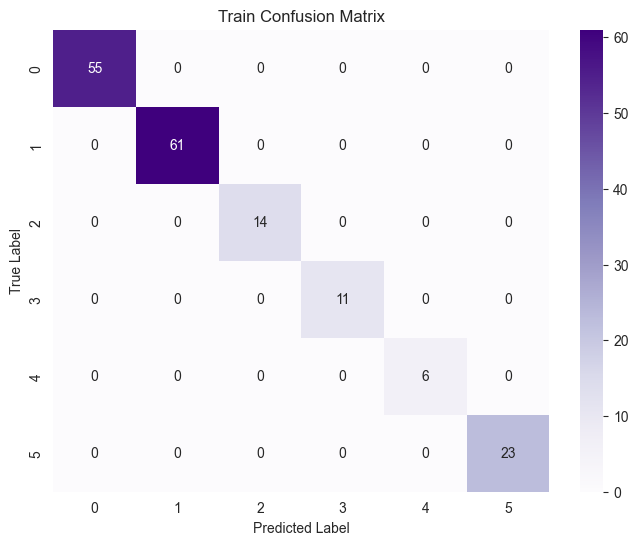

In [74]:
plot_confusion_matrix(y_train, y_pred_train, target_names=target_names, title='Train Confusion Matrix', cmap='Purples')

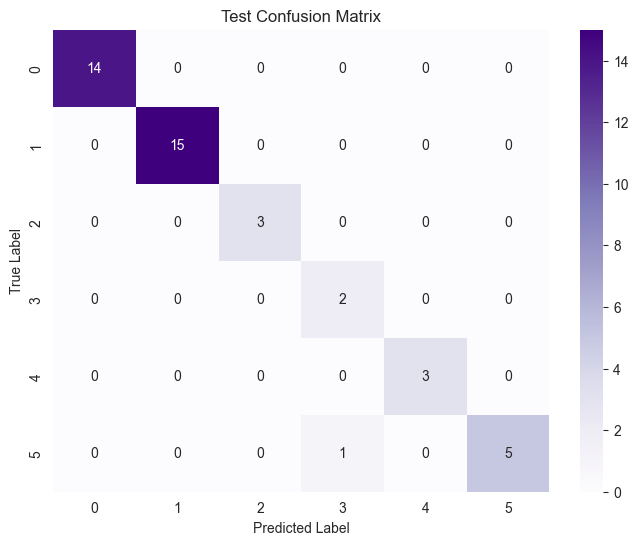

In [75]:
plot_confusion_matrix(y_test, y_pred_test, target_names=target_names, title='Test Confusion Matrix', cmap='Purples')

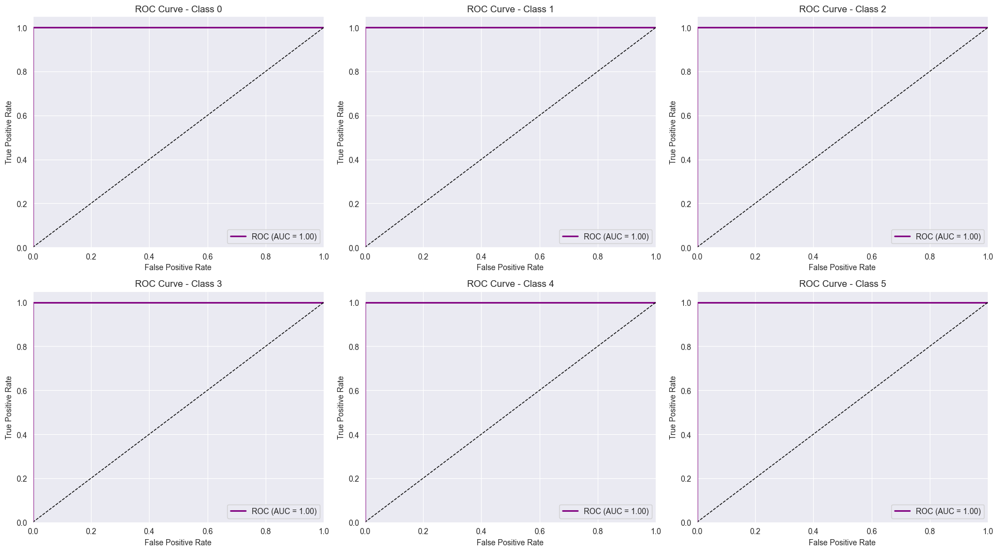

In [76]:
plot_roc_curves(best_rf, X_train, y_train, colors=['purple'])

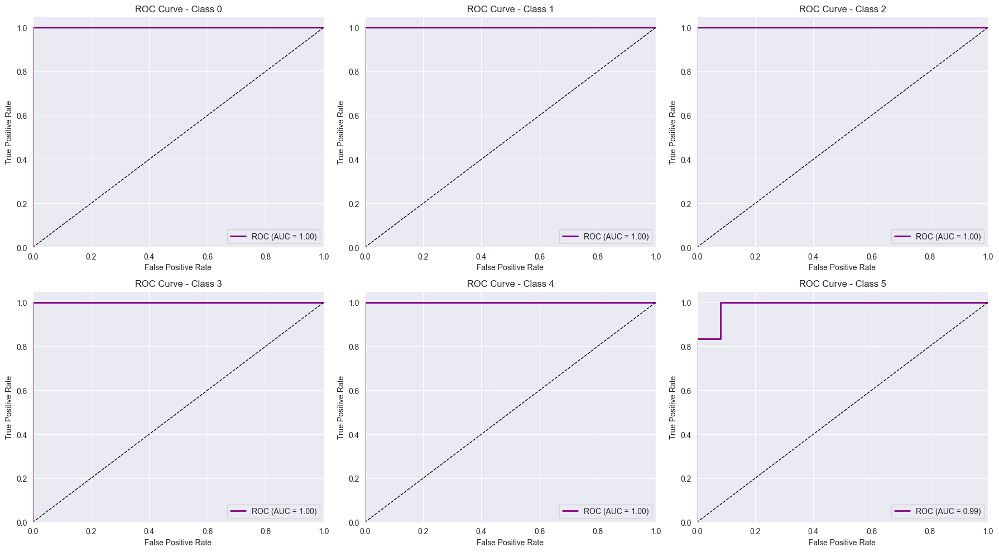

In [77]:
plot_roc_curves(best_rf, X_test, y_test, colors=['purple'])